In [2]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

import tensorflow as tf
from tensorflow import keras

In [3]:
!unzip /content/Dataset.zip -d /content/dataset


Streaming output truncated to the last 5000 lines.
  inflating: /content/dataset/Dataset/Tomato___Tomato_Yellow_Leaf_Curl_Virus/image (132).JPG  
  inflating: /content/dataset/Dataset/Tomato___Tomato_Yellow_Leaf_Curl_Virus/image (1320).JPG  
  inflating: /content/dataset/Dataset/Tomato___Tomato_Yellow_Leaf_Curl_Virus/image (1321).JPG  
  inflating: /content/dataset/Dataset/Tomato___Tomato_Yellow_Leaf_Curl_Virus/image (1322).JPG  
  inflating: /content/dataset/Dataset/Tomato___Tomato_Yellow_Leaf_Curl_Virus/image (1323).JPG  
  inflating: /content/dataset/Dataset/Tomato___Tomato_Yellow_Leaf_Curl_Virus/image (1324).JPG  
  inflating: /content/dataset/Dataset/Tomato___Tomato_Yellow_Leaf_Curl_Virus/image (1325).JPG  
  inflating: /content/dataset/Dataset/Tomato___Tomato_Yellow_Leaf_Curl_Virus/image (1326).JPG  
  inflating: /content/dataset/Dataset/Tomato___Tomato_Yellow_Leaf_Curl_Virus/image (1327).JPG  
  inflating: /content/dataset/Dataset/Tomato___Tomato_Yellow_Leaf_Curl_Virus/image (13

In [24]:
path = '/content/dataset/Dataset'  # your dataset folder containing class subfolders

train_ds = keras.utils.image_dataset_from_directory(
    path,
    validation_split=0.2,      # 20% for validation
    subset='training',         # training subset
    seed=123,
    image_size=(224, 224),
    batch_size=32,
    shuffle=True
)

val_ds = keras.utils.image_dataset_from_directory(
    path,
    validation_split=0.2,      # same split
    subset='validation',       # validation subset
    seed=123,
    image_size=(224, 224),
    batch_size=32,
    shuffle=True
)


Found 59486 files belonging to 37 classes.
Using 47589 files for training.
Found 59486 files belonging to 37 classes.
Using 11897 files for validation.


In [25]:
classes = train_ds.class_names
classes

['Apple___Black_rot',
 'Apple___Cedar_apple_rust',
 'Apple___healthy',
 'Background_without_leaves',
 'Blueberry___healthy',
 'Cherry___Powdery_mildew',
 'Corn___Cercospora_leaf_spot Gray_leaf_spot',
 'Corn___Common_rust',
 'Corn___Northern_Leaf_Blight',
 'Corn___healthy',
 'Grape___Black_rot',
 'Grape___Esca_(Black_Measles)',
 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)',
 'Grape___healthy',
 'Orange___Haunglongbing_(Citrus_greening)',
 'Peach___Bacterial_spot',
 'Peach___healthy',
 'Pepper,_bell___Bacterial_spot',
 'Pepper,_bell___healthy',
 'Potato___Early_blight',
 'Potato___Late_blight',
 'Potato___healthy',
 'Raspberry___healthy',
 'Soybean___healthy',
 'Squash___Powdery_mildew',
 'Strawberry___Leaf_scorch',
 'Strawberry___healthy',
 'Tomato___Bacterial_spot',
 'Tomato___Early_blight',
 'Tomato___Late_blight',
 'Tomato___Leaf_Mold',
 'Tomato___Septoria_leaf_spot',
 'Tomato___Spider_mites Two-spotted_spider_mite',
 'Tomato___Target_Spot',
 'Tomato___Tomato_Yellow_Leaf_Curl_Virus',

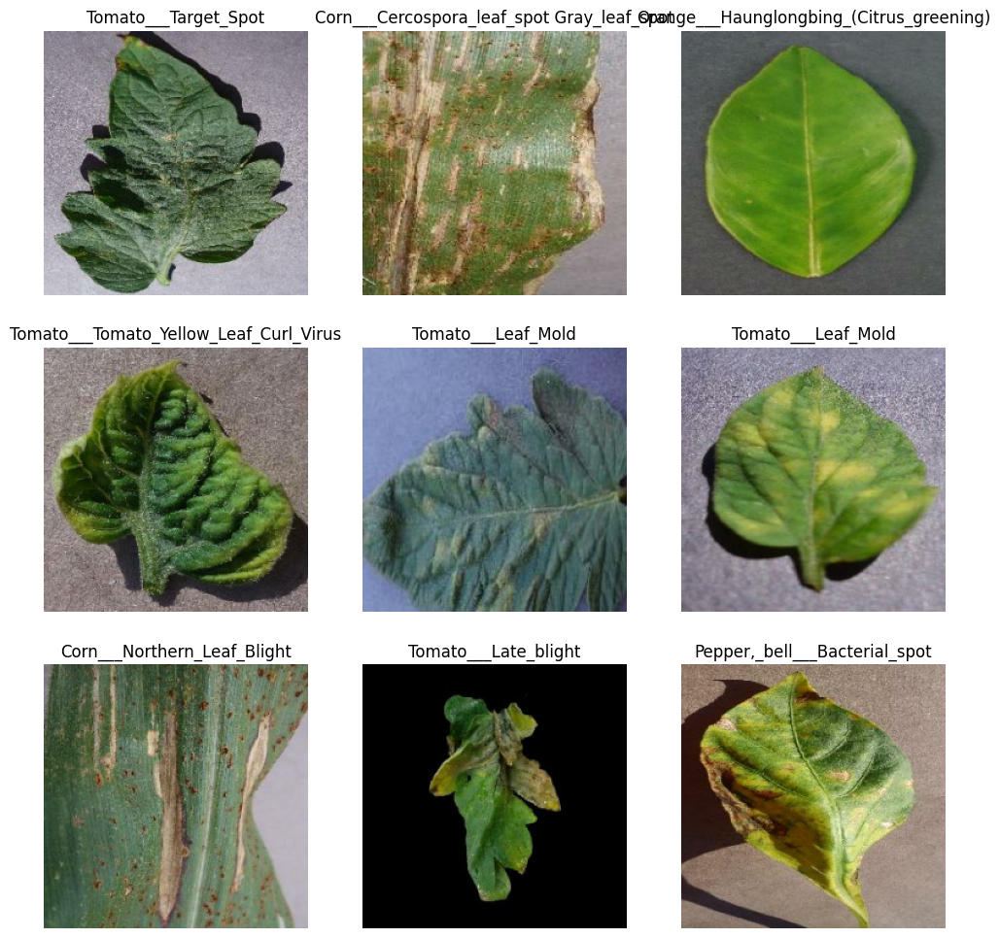

In [27]:
plt.figure(figsize=(12, 12))
for images, labels in train_ds.take(1):  # one batch
    for i in range(9):  # show first 9 images
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))  # convert to uint8 for display
        plt.title(classes[labels[i]])
        plt.axis("off")

In [29]:
model = keras.Sequential([
    keras.Input(shape=(224, 224, 3)),  # 👈 define input shape here
    keras.layers.Rescaling(1./255),

    keras.layers.Conv2D(32, (3, 3), activation='relu'),
    keras.layers.MaxPooling2D((2, 2)),
    keras.layers.Dropout(0.2),

    keras.layers.Conv2D(64, (3, 3), activation='relu'),
    keras.layers.MaxPooling2D((2, 2)),
    keras.layers.Dropout(0.2),

    keras.layers.Conv2D(64, (3, 3), activation='relu'),
    keras.layers.MaxPooling2D((2, 2)),
    keras.layers.Dropout(0.2),

    keras.layers.Conv2D(64, (3, 3), activation='relu'),
    keras.layers.MaxPooling2D((2, 2)),
    keras.layers.Dropout(0.2),

    keras.layers.Conv2D(128, (3, 3), activation='relu'),
    keras.layers.MaxPooling2D((2, 2)),

    keras.layers.Flatten(),
    keras.layers.Dense(128, activation='relu'),
    keras.layers.Dense(64, activation='relu'),
    keras.layers.Dense(38, activation='softmax')
])


In [30]:
model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)


In [31]:
model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ rescaling_2 (Rescaling)         │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (None, 222, 222, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_10 (MaxPooling2D) │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 111, 111, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, 109, 109, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_11 (MaxPooling2D) │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_9 (Dropout)             │ (None, 54, 54, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_12 (Conv2D)              │ (None, 52, 52, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_12 (MaxPooling2D) │ (None, 26, 26, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_10 (Dropout)            │ (None, 26, 26, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_13 (Conv2D)              │ (None, 24, 24, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_13 (MaxPooling2D) │ (None, 12, 12, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_11 (Dropout)            │ (None, 12, 12, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_14 (Conv2D)              │ (None, 10, 10, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_14 (MaxPooling2D) │ (None, 5, 5, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 3200)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 128)            │       409,728 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 38)             │         2,470 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 587,558 (2.24 MB)

 Trainable params: 587,558 (2.24 MB)

 Non-trainable params: 0 (0.00 B)

In [32]:
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

# Optional: stop training early if val_loss doesn't improve
early_stop = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

# Optional: save best model during training
checkpoint = ModelCheckpoint('best_model.keras', save_best_only=True)

# Train the model
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=20,
    callbacks=[early_stop, checkpoint]  # add callbacks here
)


Epoch 1/20
1488/1488 ━━━━━━━━━━━━━━━━━━━━ 84s 52ms/step - accuracy: 0.3079 - loss: 2.5847 - val_accuracy: 0.6866 - val_loss: 1.0170
Epoch 2/20
1488/1488 ━━━━━━━━━━━━━━━━━━━━ 82s 55ms/step - accuracy: 0.7195 - loss: 0.8877 - val_accuracy: 0.7958 - val_loss: 0.6449
Epoch 3/20
1488/1488 ━━━━━━━━━━━━━━━━━━━━ 132s 48ms/step - accuracy: 0.8223 - loss: 0.5549 - val_accuracy: 0.8511 - val_loss: 0.4731
Epoch 4/20
1488/1488 ━━━━━━━━━━━━━━━━━━━━ 72s 48ms/step - accuracy: 0.8682 - loss: 0.4019 - val_accuracy: 0.8880 - val_loss: 0.3551
Epoch 5/20
1488/1488 ━━━━━━━━━━━━━━━━━━━━ 82s 48ms/step - accuracy: 0.8952 - loss: 0.3138 - val_accuracy: 0.8945 - val_loss: 0.3365
Epoch 6/20
1488/1488 ━━━━━━━━━━━━━━━━━━━━ 72s 49ms/step - accuracy: 0.9161 - loss: 0.2489 - val_accuracy: 0.8833 - val_loss: 0.3724
Epoch 7/20
1488/1488 ━━━━━━━━━━━━━━━━━━━━ 82s 48ms/step - accuracy: 0.9306 - loss: 0.2064 - val_accuracy: 0.9016 - val_loss: 0.3104
Epoch 8/20
1488/1488 ━━━━━━━━━━━━━━━━━━━━ 82s 48ms/step - accuracy: 0.9382 

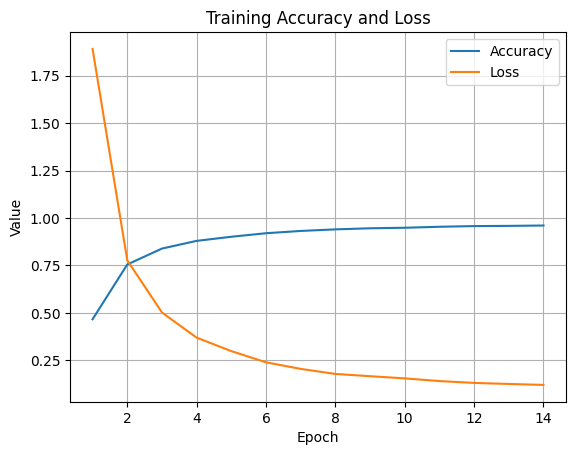

In [33]:
 accuracy = history.history['accuracy']
loss = history.history['loss']
epochs = range(1, len(accuracy) + 1)  # Dynamically set based on actual training

plt.plot(epochs, accuracy, label='Accuracy')
plt.plot(epochs, loss, label='Loss')
plt.xlabel('Epoch')
plt.ylabel('Value')
plt.title('Training Accuracy and Loss')
plt.legend()
plt.grid(True)
plt.show()


In [34]:
model.evaluate(val_ds)


372/372 ━━━━━━━━━━━━━━━━━━━━ 11s 29ms/step - accuracy: 0.9308 - loss: 0.2246


[0.2237110733985901, 0.931999683380127]

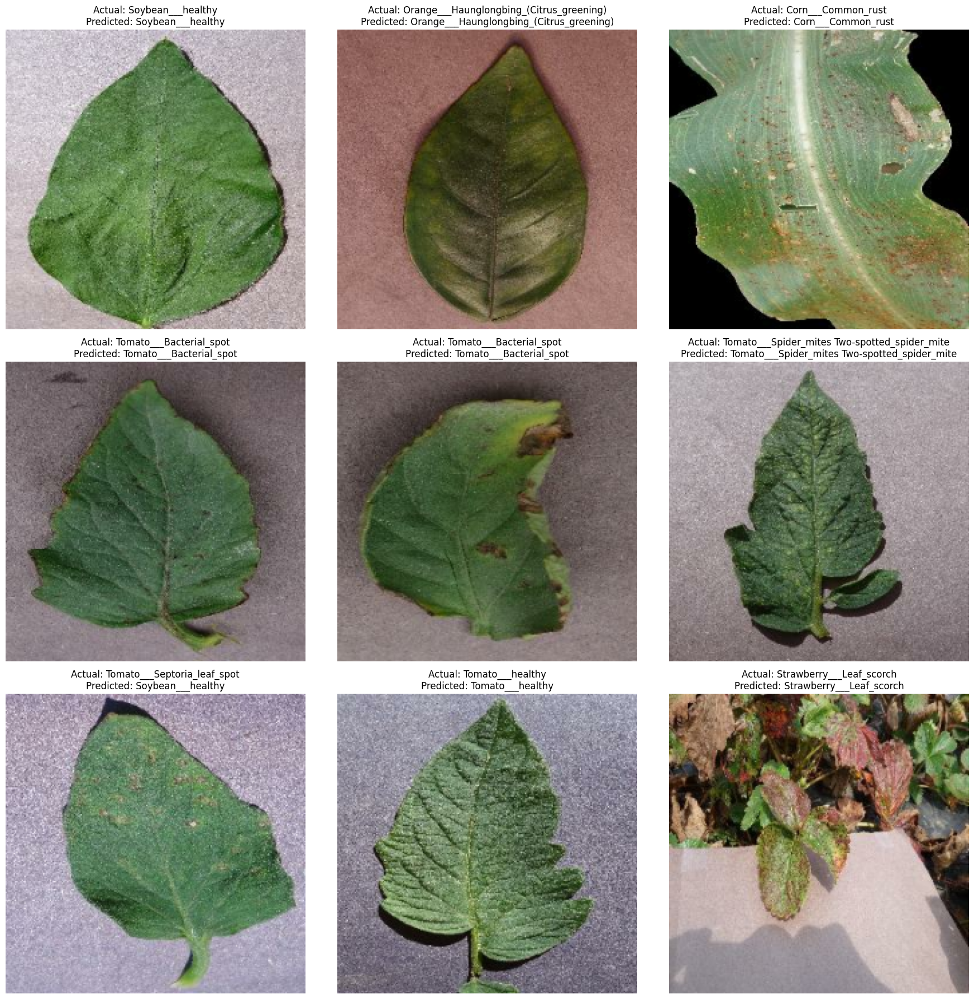

In [35]:
# Get class names from dataset
classes = val_ds.class_names

# Function to prepare image for prediction
def img_to_pred(image):
    image = tf.expand_dims(image, 0)  # Add batch dimension
    return image

# Plot predictions
plt.figure(figsize=(18, 18))
for images, labels in val_ds.take(1):  # take one batch
    for i in range(min(9, len(images))):  # avoid index error
        plt.subplot(3, 3, i+1)
        plt.imshow(images[i].numpy().astype('uint8'))
        plt.axis('off')

        actual = classes[labels[i].numpy()]  # convert tensor to int
        pred = model.predict(img_to_pred(images[i]), verbose=0)
        predicted = classes[np.argmax(pred)]

        plt.title(f"Actual: {actual}\nPredicted: {predicted}")
plt.tight_layout()
plt.show()


In [36]:
model.save('plant_disease_model.h5')


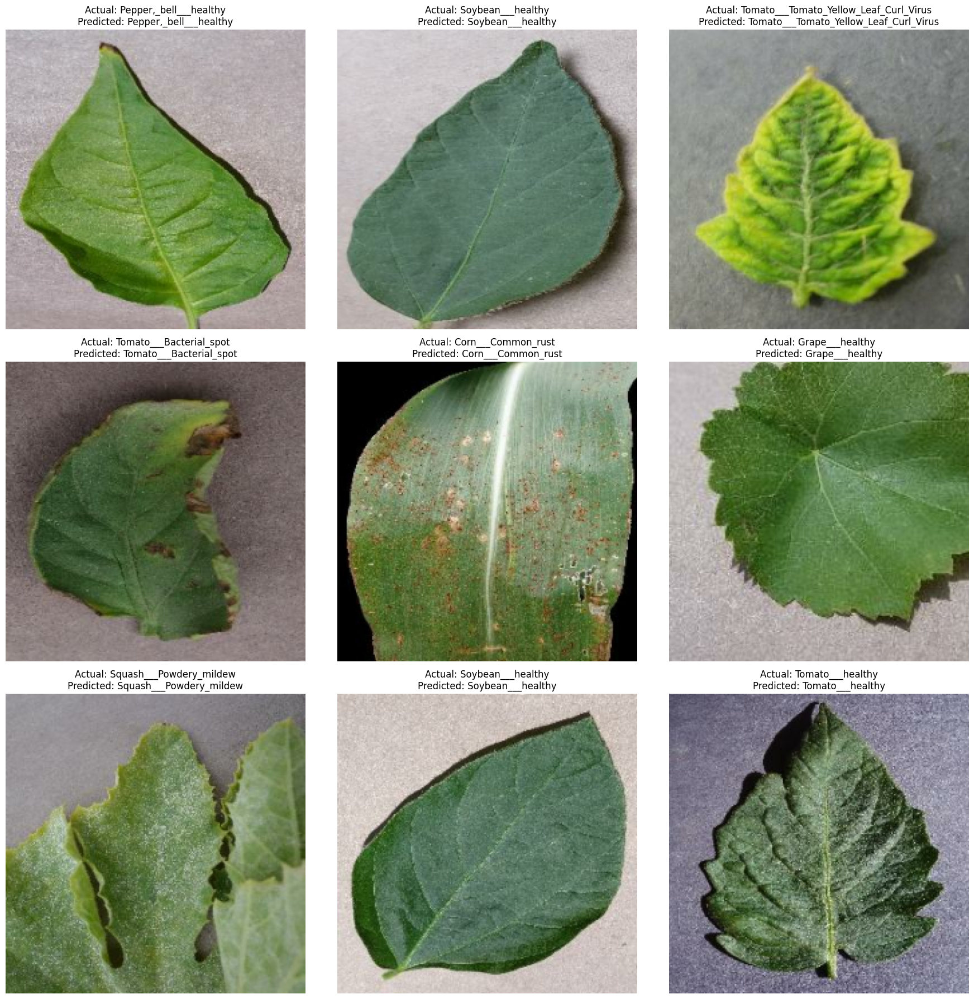

In [37]:
def img_to_pred(image):
    image = tf.expand_dims(image, 0)  # Add batch dimension
    return image

# Get class names from your dataset
classes = val_ds.class_names

# Plot first 9 images with actual vs predicted labels
plt.figure(figsize=(18, 18))
for images, labels in val_ds.take(1):  # take one batch
    for i in range(min(9, len(images))):  # up to 9 images
        plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype('uint8'))
        plt.axis('off')

        actual = classes[labels[i].numpy()]
        preds = model.predict(img_to_pred(images[i]), verbose=0)
        predicted = classes[np.argmax(preds)]

        plt.title(f"Actual: {actual}\nPredicted: {predicted}")
plt.tight_layout()
plt.show()